# Imports

In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.exposure import equalize_adapthist
from skimage.filters import sobel
from skimage.morphology import square, disk, erosion, area_opening, binary_opening, remove_small_objects,
    binary_dilation

from src.models import InputImage
from src.well import find_well_props

# Functions

In [2]:
def plot_images(images, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary'):
    if count is not None:
        images = images[0:count]

    l = len(images)

    if cols is None:
        cols = 4
    rows = int(l / cols)
    if l < cols: cols = l
    if l % cols != 0 or rows == 0:
        rows += 1

    fig, ax = plt.subplots(rows, cols, figsize=fig)
    ax = ax.ravel()
    for i, img in enumerate(images):
        if i >= l: return

        if not ticks:  # turn off ticks
            ax[i].get_xaxis().set_visible(False)
            ax[i].get_yaxis().set_visible(False)

        ax[i].imshow(img, cmap)

In [3]:
def plot_fishes(fishes, cols: int = None, count: int = None, fig: (int, int) = (16, 16), ticks=False, cmap='binary'):
    images = list(map(lambda x: x.processed, fishes))  # Change this!
    plot_images(images, cols, count, fig, ticks, cmap)

# Fishes in extracted wells

In [4]:
fishes = [InputImage("zf1.JPG"), InputImage("zf2.JPG"), InputImage("zf3.JPG"), InputImage("zf4.JPG"),
          InputImage("zf5.JPG"), InputImage("zf6.JPG"), InputImage("zf7.JPG"), InputImage("zf8.JPG")]

for fish in fishes:
    fish = find_well_props(fish)

# Searching for well properties
_____________________________________________________________
# Hough-transformation for the well
_____________________________________________________________
# Hough-transformation finished
_____________________________________________________________
# Creating circle mask for well
_____________________________________________________________
# Circle mask for well created
_____________________________________________________________
# Creating remaining masks:
_____________________________________________________________
# Creating cropped mask
_____________________________________________________________
# Creating masked image (original)
_____________________________________________________________
# Creating masked image (cropped)
_____________________________________________________________
# Created remaining masks
_____________________________________________________________
# Finished searching for well properties
_____________________________

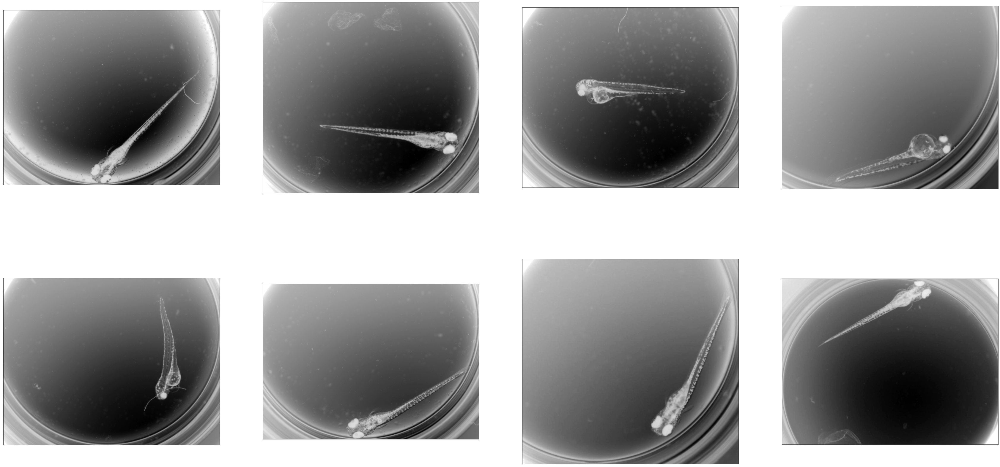

In [5]:
plot_fishes(fishes, fig=(60, 30))

In [6]:
masks = []
maskeds = []
for fish in fishes:
    masks.append(fish.well_props.mask.cropped)
    maskeds.append(fish.well_props.mask.cropped_masked)

## Functions

In [7]:
def edge_finding(img: np.ndarray) -> np.ndarray:  # Function replacing edge filter
    edges = sobel(img)  # rangefilter
    return equalize_adapthist(edges)  # strech contrast

In [8]:
def denoising(img: np.ndarray, strength=20) -> np.ndarray:
    return cv2.fastNlMeansDenoising(img, None, strength)  # denoise

In [9]:
def adaptiveTh(img: np.ndarray, block_size=7) -> np.ndarray:
    return cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, block_size, 1)

# Rangefilter*

In [10]:
edge = []
"""for fish in fishes:
    edges = edge_finding(fish.processed) # rangefilter
    n = cv2.normalize(src=edges, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)  # normalize for uint8
    fish.processed = n.astype(np.uint8)  # convert to uint8"""
for fish in fishes:
    a = edge_finding(fish.processed)
    n = cv2.normalize(src=a, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)  # normalize for uint8
    edge.append(n.astype(np.uint8))

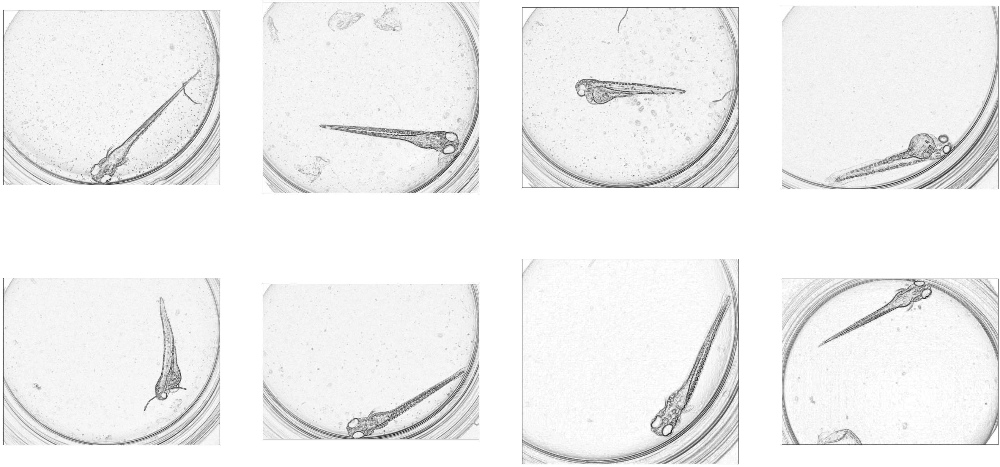

In [11]:
# plot_fishes(fishes, fig=(20, 10))
plot_images(edge, fig=(60, 30))

# Wiener filter*

In [55]:
denoised = []
# for fish in fishes:
#    fish.processed = denoising(fish.processed) # wiener filter
for fish in edge:
    denoised.append(denoising(fish, strength=30))

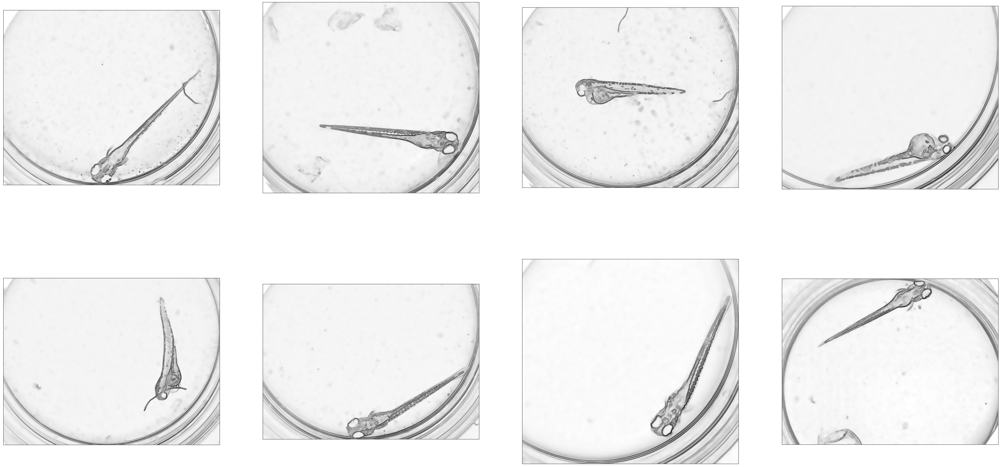

In [56]:
# plot_fishes(fishes, fig=(60, 30))
plot_images(denoised, fig=(60, 30))

# Adaptive threshold

In [76]:
ath = []
# for fish in fishes:
# fish.processed = adaptiveTh(fish.processed)
for i, fish in enumerate(denoised):
    ath.append(adaptiveTh(fish, block_size=9) * masks[i])

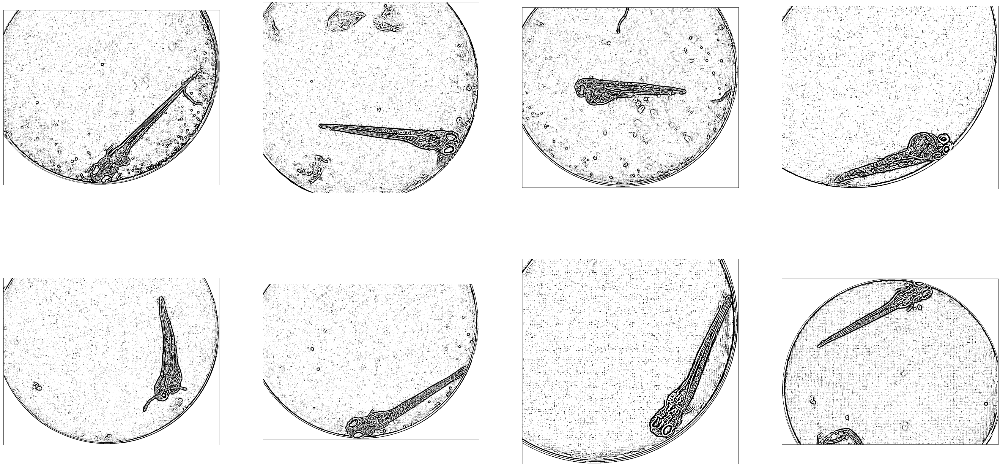

In [77]:
# plot_fishes(fishes, fig=(20, 10))
plot_images(ath, fig=(60, 30))

# bwareaopen

In [ ]:
from skimage.morphology import area_closing, closing

bwao = []
for fish in ath:
    bwao.append(area_opening(fish, area_threshold=500))

In [ ]:
plot_images(bwao, fig=(60, 30))

# Closing

In [ ]:
closed = []
for fish in bwao:
    bwao.append((closing(fish, disk(3))))

In [ ]:
plot_images(closed, fig=(60, 30))

In [49]:
def get_perim(bin_img: np.ndarray) -> np.ndarray:
    BW = bin_img
    se = disk(11)
    BWerode = erosion(BW, se)
    return np.abs(np.subtract(BWerode, BW))

In [74]:
perims = []
wo_perims = []
for i, fish in enumerate(bwao):
    perim = dilation(get_perim(masks[i]), disk(5))
    perims.append(perim)
    wo_perims.append(fish * ~perim)

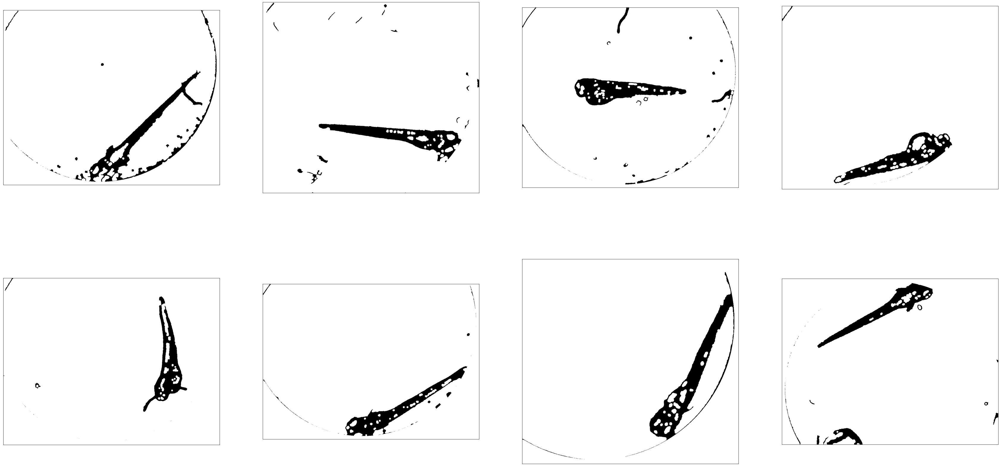

In [75]:
plot_images(wo_perims, fig=(60, 30))

# Dilation - fail

In [39]:
dil = []
for fish in wo_perims:
    a = erosion(fish, disk(3))
    a = dilation(a, disk(7))
    dil.append(a)

plot_images(dil, fig=(60, 20))

TypeError: disk() missing 1 required positional argument: 'radius'

# 2 largest

C:\Users\gimes\.miniconda\lib\site-packages\skimage\_shared\utils.py:157: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  return func(*args, **kwargs)


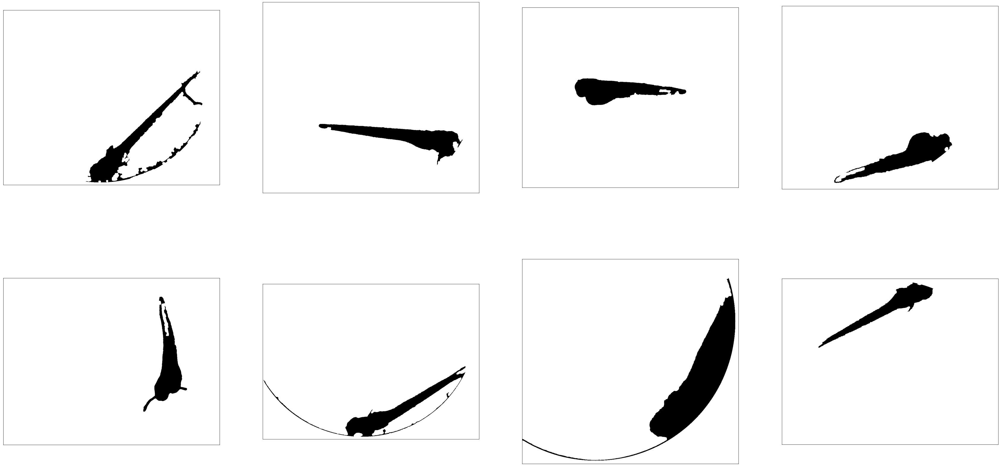

In [22]:
from skimage.morphology import binary_closing, remove_small_holes
from src.utils import keep_2_largest_object, keep_largest_object

_2 = []
for i, fish in enumerate(dil):
    _2.append(remove_small_holes(keep_largest_object(fish, filled=True), area_threshold=500))

plot_images(_2, fig=(60, 30))

_________________________________________

In [23]:
fish = fishes[5]

In [24]:
from skimage.morphology import disk, erosion


def get_menisc(binary_img: np.ndarray, mask: np.ndarray, corrected=False) -> np.ndarray:
    possible_well_size_th = np.zeros_like(binary_img)
    remaining_binary_img = binary_img.copy()

    if not corrected:
        structuring_element = disk(21)
        eroded_well = erosion(mask, structuring_element)
        remaining_binary_img[np.where(eroded_well > 0)] = 0
    #    remaining_binary_img = morphology.area_opening(remaining_binary_img, 100)

    mh, mw = binary_img.shape
    h_center, w_center = int(mh / 2), int(mw / 2)

    lt = remaining_binary_img[0:h_center, 0:w_center]
    lb = remaining_binary_img[h_center:mh, 0:w_center]
    rt = remaining_binary_img[0:h_center, w_center:mw]
    rb = remaining_binary_img[h_center:mh, w_center:mw]

    cont = get_perim(mask)

    lt_thresh = mean_4_col_sum(lt, "lt", corrected, cont)
    lb_thresh = mean_4_col_sum(lb, "lb", corrected, cont)
    rt_thresh = mean_4_col_sum(rt, "rt", corrected, cont)
    rb_thresh = mean_4_col_sum(rb, "rb", corrected, cont)

    left_side = np.concatenate((lt, lb), axis=0)
    right_side = np.concatenate((rt, rb), axis=0)
    full = np.concatenate((left_side, right_side), axis=1)

    return full

In [25]:
from skimage.morphology import dilation


def mean_4_col_sum(data: np.ndarray, corner: str, corrected: bool, container: np.ndarray):
    print(corner)
    thresh_well = np.zeros_like(data)

    col_sum = np.sum(data, axis=0)
    csum = col_sum[col_sum > 0]

    mean_data = np.floor(np.mean(csum))  # ROHADT NAGY LESZ!?

    if not np.isnan(mean_data):
        se = disk(mean_data)
        cx, cy = int(container.shape[0] / 2), int(container.shape[1] / 2)

        lastx, lasty = container.shape[0] - 1, container.shape[1] - 1

        if corner == 'lt':
            return dilation(container[0:cx, 0:cy])
        elif corner == 'lb':
            return dilation(container[0:cx, cy:lasty])
        elif corner == 'rt':
            return dilation(container[cx:lastx, 0:cy])
        elif corner == 'rb':
            return dilation(container[cx:lastx, cy:lasty])

In [26]:
plt.imshow(get_menisc(bwao[2], masks[2]), 'binary')

lt
lb


C:\Users\gimes\.miniconda\lib\site-packages\numpy\core\fromnumeric.py:3440: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\gimes\.miniconda\lib\site-packages\numpy\core\_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


rt


MemoryError: Unable to allocate 5.28 GiB for an array with shape (26613, 26613) and data type float64

# Denoise with cv2

In [ ]:
s = sobel(fish.processed)  # rangefilter
eah = equalize_adapthist(s)  # stretch contrast
n = cv2.normalize(src=eah, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)  # normalize for uint8
a = n.astype(np.uint8)  # convert to uint8
denoised = cv2.fastNlMeansDenoising(a, None, 10)  # denoising

fig, ax = plt.subplots(2, 2, figsize=(20, 15))
ax = ax.ravel()

ax[0].imshow(s, 'binary')
ax[1].imshow(eah, 'binary')
ax[2].imshow(a, 'binary')
ax[3].imshow(denoised, 'binary')

# Contour of well

In [ ]:
from skimage.measure import find_contours

mask = fish.well_props.mask.cropped

fig, ax = plt.subplots(1, 2, figsize=(18, 8))
ax = ax.ravel()

c = np.asarray(find_contours(mask))[0]
zeros = np.zeros_like(mask)
ax[0].imshow(mask, 'gray')
print(c)

ax[1].imshow(zeros, 'gray')

for c_ in c:
    ax[1].plot(c[:, 1], c[:, 0], color='white', linewidth=0.5)



# Adaptive Threshold

In [ ]:
import math

szam = 2 * math.floor(denoised.shape[0] / 14) + 1
th = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 5, 1)
print(th)
plt.imshow(th, 'gray')

# HOMOMORPHIC - fail

In [ ]:
from cv2 import normalize, NORM_MINMAX
from src.utils.homomorphic import homomorphic

bbox = fish.well_props.bounding_box
pre_homomorphic = fish.og[bbox.x1:bbox.x2, bbox.y1:bbox.y2]
print(pre_homomorphic.dtype)
pre_homomorphic = normalize(src=pre_homomorphic, dst=None, alpha=0, beta=1, norm_type=NORM_MINMAX)

print(pre_homomorphic)
ill_corrected = homomorphic(pre_homomorphic, a=1, b=1, cutoff=0.015, order=1)
plt.imshow(ill_corrected, 'binary')

# Wiener - fail

In [ ]:
from scipy.signal import wiener
from skimage.filters.edges import sobel

fig, ax = plt.subplots(1, 2, figsize=(100, 70))
ax = ax.ravel()

sob = sobel(ill_corrected)
win = wiener(ill_corrected, (30, 30))

ax[0].imshow(sob, 'binary')
ax[1].imshow(win, 'binary')

In [ ]:
import numpy as np
from skimage import restoration

img = sob
from scipy.signal import convolve2d

psf = np.ones((5, 5))
img = convolve2d(sob, psf, 'same')
rng = np.random.default_rng()
img += 0.1 * img.std() * rng.standard_normal(img.shape)

deconvolved_img = restoration.wiener(sob, psf, 1000)
plt.imshow(deconvolved_img, 'binary')